## 2. Classify images with road 
---
Last edited: 04/27/2022 by Jeongkyung Won<br>
This code uses 1970 NGII maps to classify images with or without roads


In [ ]:
# Common imports
import numpy as np
import os
import pandas as pd
import cv2
import time

import shutil
from pathlib import Path
import os.path

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from tensorflow.data import AUTOTUNE

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
"""
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
"""

# random seed
my_seed = 42

# to make this notebook's output stable across runs
np.random.seed(my_seed)

### 2.1. Set-Ups for TPU

#### 2.1.1. TPU Activation

In [ ]:
# tpu initilization

resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='')
tf.config.experimental_connect_to_cluster(resolver)
# This is the TPU initialization code that has to be at the beginning.
tf.tpu.experimental.initialize_tpu_system(resolver)
print("All devices: ", tf.config.list_logical_devices('TPU'))

INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Initializing the TPU system: grpc://10.115.178.26:8470


INFO:tensorflow:Initializing the TPU system: grpc://10.115.178.26:8470


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Finished initializing TPU system.


All devices:  [LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:0', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:1', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:2', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:3', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:4', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:5', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:6', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:7', device_type='TPU')]


In [ ]:
# distribution strategies

strategy = tf.distribute.TPUStrategy(resolver)

INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


#### 2.1.2. Configuration

In [ ]:
EPOCHS = 25
IMAGE_SIZE = [200, 200]
img_size = (200, 200)
#my_seed=42
my_seed=1

#### 2.1.3. Learning Rate

In [ ]:
# batch and learning rate settings
if strategy.num_replicas_in_sync == 8: # TPU or 8xGPU
    BATCH_SIZE = 10 * strategy.num_replicas_in_sync
    VALIDATION_BATCH_SIZE = 10 * strategy.num_replicas_in_sync
    start_lr = 0.00001
    min_lr = 0.00001
    max_lr = 0.000015 * strategy.num_replicas_in_sync
    rampup_epochs = 15
    sustain_epochs = 0
    exp_decay = .8
elif strategy.num_replicas_in_sync == 1: # single GPU
    BATCH_SIZE = 10
    VALIDATION_BATCH_SIZE = 10
    start_lr = 0.00001
    min_lr = 0.00001
    max_lr = 0.0002
    rampup_epochs = 10
    sustain_epochs = 0
    exp_decay = .8
else: # TPU pod
    BATCH_SIZE = 10 * strategy.num_replicas_in_sync
    VALIDATION_BATCH_SIZE = 10 * strategy.num_replicas_in_sync
    start_lr = 0.00001
    min_lr = 0.00001
    max_lr = 0.000015 * strategy.num_replicas_in_sync
    rampup_epochs = 10
    sustain_epochs = 0
    exp_decay = .8

1e-05 2.476395008000001e-05


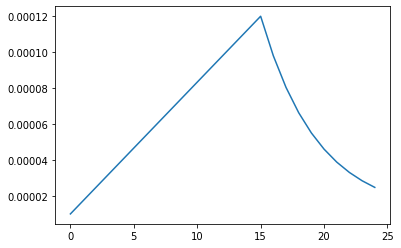

In [ ]:
def lrfn(epoch):
    def lr(epoch, start_lr, min_lr, max_lr, rampup_epochs, sustain_epochs, exp_decay):
        if epoch < rampup_epochs:
            lr = (max_lr - start_lr)/rampup_epochs * epoch + start_lr
        elif epoch < rampup_epochs + sustain_epochs:
            lr = max_lr
        else:
            lr = (max_lr - min_lr) * exp_decay**(epoch-rampup_epochs-sustain_epochs) + min_lr
        return lr
    return lr(epoch, start_lr, min_lr, max_lr, rampup_epochs, sustain_epochs, exp_decay)
    
lr_callback = tf.keras.callbacks.LearningRateScheduler(lambda epoch: lrfn(epoch), verbose=True)

rng = [i for i in range(EPOCHS)]
y = [lrfn(x) for x in rng]
plt.plot(rng, [lrfn(x) for x in rng])
print(y[0], y[-1])

### 2.2. Load Train/ Test Dataset

In [ ]:
# Define Dropbox Function

import requests
import zipfile
from urllib.parse import unquote # for url string conversion
import re
from tqdm import tqdm

def download_dropbox(url, folder):
  ## version 2.0, last modified by Hyunjoo Yang (hyang@sogang.ac.kr) on Jan. 14 2022
  ## This function downloads dropbox shareable link to a local folder (tested for file downloading, but not for shared folder!)
  
  # url: dropbox shareable link for downloading
  # folder: where to download
  
  headers = {'user-agent': 'Wget/1.16 (linux-gnu)'}
  r = requests.get(url, stream=True, headers=headers)
  
  # convert dropbox shareable link ("dl=0" to "dl=1")
  url = url.replace("?dl=0", "?dl=1")

  # check if the url returns valid status code (200)
  if r.status_code == 200:
    print('The url is valid.')

    # grab filename from the url, using regular expressions (and replace space to "_" )
    file_name = unquote(re.search(r'\/([^\/]+\.([\w]+))\?dl=([01])$', url).group(1)).replace(" ", "_")

    folder_n_fname = os.path.join(folder, file_name)

    # download
    print('Begin downloading < {} >'.format(folder_n_fname))


    # Total size in bytes.
    total_size = int(r.headers.get('content-length', 0))
    block_size = 1024  # 1 Kibibyte
    t = tqdm(total=total_size, unit='B', unit_scale=True)
    with open(file_name, 'wb') as f:
      for data in r.iter_content(block_size):
        t.update(len(data))
        f.write(data)
    t.close()

    print('Finished downloading < {} >'.format(folder_n_fname))

    # unzip if zip file
    if file_name.endswith('.zip'):
      print('Extracting zip file...')
      with zipfile.ZipFile(file_name,"r") as zip_ref:
        zip_ref.extractall(folder)
    else:
      if not os.path.exists(folder):
        os.makedirs(folder)
      shutil.move(file_name, folder_n_fname)

    print('Done!')
  else:
    raise ValueError('Nothing to download: dropbox link is not valid. Check the URL link again')

#### 2.2.1. Train Datset

In [ ]:
## dropbox shareable url link

url = 'https://www.dropbox.com/s/wjssbvx18pkcu2q/clipped_maps_2km_labelled.zip?dl=0' # NGII_1970_clipped_maps_2km_labelled

# file path for download and unzip
labelled_path = './labelled_images'

# download dropbox shared file and unzip it
download_dropbox(url, labelled_path)

The url is valid.
Begin downloading < ./labelled_images/clipped_maps_2km_labelled.zip >


100%|██████████| 210M/210M [00:03<00:00, 65.2MB/s]


Finished downloading < ./labelled_images/clipped_maps_2km_labelled.zip >
Extracting zip file...
Done!


In [ ]:
w_road_dr=Path('./labelled_images/with_road')
wo_road_dr=Path('./labelled_images/without_road')

In [ ]:
w_road=pd.Series(list(w_road_dr.glob(r'*.png')),name='filepath').astype(str)
w_road_df=w_road.to_frame()
w_road_df

,filepath
0,labelled_images/with_road/12802.png
1,labelled_images/with_road/10441.png
2,labelled_images/with_road/14705.png
3,labelled_images/with_road/9920.png
4,labelled_images/with_road/10592.png
...,...
495,labelled_images/with_road/15319.png
496,labelled_images/with_road/15137.png
497,labelled_images/with_road/15143.png
498,labelled_images/with_road/12324.png


In [ ]:
wo_road=pd.Series(list(wo_road_dr.glob(r'*.png')),name='filepath').astype(str)
wo_road_df=wo_road.to_frame()
wo_road_df

,filepath
0,labelled_images/without_road/21789.png
1,labelled_images/without_road/11697.png
2,labelled_images/without_road/22925.png
3,labelled_images/without_road/7326.png
4,labelled_images/without_road/179.png
...,...
495,labelled_images/without_road/11508.png
496,labelled_images/without_road/176.png
497,labelled_images/without_road/6044.png
498,labelled_images/without_road/22807.png


In [ ]:
# Add Labels indicating whether the image contains any road
w_road_df['road']=1
wo_road_df['road']=0

In [ ]:
train_images=pd.concat([w_road_df,wo_road_df],axis=0).sample(frac=1.0,random_state=1).reset_index(drop=True)
train_images

,filepath,road
0,labelled_images/without_road/10458.png,0
1,labelled_images/without_road/21983.png,0
2,labelled_images/with_road/11736.png,1
3,labelled_images/with_road/13247.png,1
4,labelled_images/with_road/14029.png,1
...,...,...
995,labelled_images/without_road/14271.png,0
996,labelled_images/with_road/12375.png,1
997,labelled_images/without_road/11550.png,0
998,labelled_images/with_road/14666.png,1


In [ ]:
# shuffle data frame
from sklearn.utils import shuffle
train_images_shuffled=shuffle(train_images, random_state=42)

#### 2.2.2. Test Datset 
---
here I first collect all map images and filter out the ones used for training

In [ ]:
# add a column for grid id
# this will be used as a key for merging data

train_images_list=train_images_shuffled['filepath']
train_images_path=train_images_list.reset_index(drop=True)

train_images_id=pd.Series(train_images_path.apply(lambda x: os.path.splitext(os.path.split(x)[1])[0]), name='id').astype(str)
train_images_id

0      10416
1      13825
2      21793
3        190
4      21986
       ...  
995    11693
996    13404
997      230
998     6688
999      246
Name: id, Length: 1000, dtype: object

In [ ]:
train_images_df=pd.concat([train_images_path, train_images_id],axis=1).sample(frac=1.0,random_state=1).reset_index(drop=True)
train_images_df

,filepath,id
0,labelled_images/without_road/9336.png,9336
1,labelled_images/without_road/212.png,212
2,labelled_images/with_road/11989.png,11989
3,labelled_images/with_road/13996.png,13996
4,labelled_images/without_road/144.png,144
...,...,...
995,labelled_images/with_road/11537.png,11537
996,labelled_images/with_road/9462.png,9462
997,labelled_images/without_road/186.png,186
998,labelled_images/without_road/2923.png,2923


In [ ]:
## dropbox shareable url link

url = 'https://www.dropbox.com/s/f9qw5txp3e51pia/clipped_maps_2km_all.zip?dl=0' # NGII_1970_clipped_maps_2km_all

# file path for download and unzip
all_images_path = './all_images'

# download dropbox shared file and unzip it
download_dropbox(url, all_images_path)

In [ ]:
image_dr=Path('./all_images/')

In [ ]:
# Collect All Map Images in the Drive
images_path=pd.Series(list(image_dr.glob(r'*.png')),name='filepath').astype(str)
images_path[:1000]

0       all_images/8606.png
1      all_images/27314.png
2       all_images/5210.png
3      all_images/14055.png
4      all_images/23484.png
               ...         
995    all_images/19489.png
996    all_images/14824.png
997     all_images/5071.png
998    all_images/12353.png
999     all_images/6742.png
Name: filepath, Length: 1000, dtype: object

In [ ]:
images_id=pd.Series(images_path.apply(lambda x: os.path.splitext(os.path.split(x)[1])[0]), name='id').astype(str)
images_id[:1000]

0       8606
1      27314
2       5210
3      14055
4      23484
       ...  
995    19489
996    14824
997     5071
998    12353
999     6742
Name: id, Length: 1000, dtype: object

In [ ]:
images_df=pd.concat([images_path, images_id],axis=1).sample(frac=1.0,random_state=1).reset_index(drop=True)
images_df

,filepath,id
0,all_images/23823.png,23823
1,all_images/15093.png,15093
2,all_images/7827.png,7827
3,all_images/12995.png,12995
4,all_images/9749.png,9749
...,...,...
16168,all_images/17261.png,17261
16169,all_images/26518.png,26518
16170,all_images/17061.png,17061
16171,all_images/1544.png,1544


In [ ]:
# merge two dataframes : train_images_df and images_df
# this is to filter out images in the training dataframe using _merge indicators
test_df=pd.merge(train_images_df,images_df, left_on='id', right_on='id', indicator=True, how='outer')
test_df

,filepath_x,id,filepath_y,_merge
0,labelled_images/without_road/9336.png,9336,all_images/9336.png,both
1,labelled_images/without_road/212.png,212,all_images/212.png,both
2,labelled_images/with_road/11989.png,11989,all_images/11989.png,both
3,labelled_images/with_road/13996.png,13996,all_images/13996.png,both
4,labelled_images/without_road/144.png,144,all_images/144.png,both
...,...,...,...,...
16168,NaN,17261,all_images/17261.png,right_only
16169,NaN,26518,all_images/26518.png,right_only
16170,NaN,17061,all_images/17061.png,right_only
16171,NaN,1544,all_images/1544.png,right_only


In [ ]:
# test_df.to_csv('NGII_1970_clipped_maps_2km_all_v2.csv')

In [ ]:
test_df=test_df.drop(test_df[test_df._merge!='right_only'].index)
test_df

,filepath_x,id,filepath_y,_merge
1000,NaN,23823,all_images/23823.png,right_only
1001,NaN,15093,all_images/15093.png,right_only
1002,NaN,7827,all_images/7827.png,right_only
1003,NaN,12995,all_images/12995.png,right_only
1004,NaN,9749,all_images/9749.png,right_only
...,...,...,...,...
16168,NaN,17261,all_images/17261.png,right_only
16169,NaN,26518,all_images/26518.png,right_only
16170,NaN,17061,all_images/17061.png,right_only
16171,NaN,1544,all_images/1544.png,right_only


In [ ]:
test_df=test_df.drop(columns=['filepath_x','id','_merge']).reset_index(drop=True)
test_df

,filepath_y
0,all_images/23823.png
1,all_images/15093.png
2,all_images/7827.png
3,all_images/12995.png
4,all_images/9749.png
...,...
15168,all_images/17261.png
15169,all_images/26518.png
15170,all_images/17061.png
15171,all_images/1544.png


In [ ]:
test_df=test_df.rename(columns={'filepath_y':'filepath'})
test_df=test_df.sample(n=1000).reset_index(drop=True)
test_df

,filepath
0,all_images/23855.png
1,all_images/22400.png
2,all_images/16711.png
3,all_images/7105.png
4,all_images/26327.png
...,...
995,all_images/25292.png
996,all_images/19973.png
997,all_images/25230.png
998,all_images/12756.png


### 2.3. Load Images to Memory

In [ ]:
train_img_paths=train_images_shuffled['filepath'].to_numpy()
train_img_paths[:10]

array(['labelled_images/without_road/10416.png',
       'labelled_images/with_road/13825.png',
       'labelled_images/without_road/21793.png',
       'labelled_images/without_road/190.png',
       'labelled_images/without_road/21986.png',
       'labelled_images/with_road/14654.png',
       'labelled_images/with_road/15152.png',
       'labelled_images/without_road/11510.png',
       'labelled_images/without_road/21990.png',
       'labelled_images/without_road/8662.png'], dtype=object)

In [ ]:
train_labels=train_images_shuffled['road'].to_numpy()
train_labels[:10]

array([0, 1, 0, 0, 0, 1, 1, 0, 0, 0])

In [ ]:
test_img_paths=test_df['filepath'].to_numpy()
test_img_paths[:10]

array(['all_images/23855.png', 'all_images/22400.png',
       'all_images/16711.png', 'all_images/7105.png',
       'all_images/26327.png', 'all_images/16670.png',
       'all_images/24085.png', 'all_images/6258.png',
       'all_images/16164.png', 'all_images/10608.png'], dtype=object)

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
train_labels = le.fit_transform(train_labels)

In [ ]:
# one hot encoding
from tensorflow.keras.utils import to_categorical
train_label=to_categorical(train_labels)
train_label[:10]

array([[1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.]], dtype=float32)

In [ ]:
# prepare to load images into memory

img_size = (200, 200)
num_imgs = len(train_img_paths)+len(test_img_paths)

num_imgs

2000

In [ ]:
# number of samples for train, validation, test

# if too many images are put into numpy arrays, it will crash session 
# 'proto_buffer_writer.h:83] assertion failed: byte_count_ < total_size_'

"""
Protobuf has a hard limit of 2GB per call, and TensorFlow can split only 
tf.data.Dataset entities via multiple Protobuf messages. 
You should either make your dataset less than 2 GB or convert it to the 
TensorFlow Dataset format.
"""

num_train_samples = 1000 # 300 images will be validation samples
num_test_samples = 1000 # these images do not have labels

In [ ]:
from tqdm import tqdm
# put images to array
from tensorflow.keras.utils import load_img, img_to_array

In [ ]:
# function: image to array

def path_to_input_image(path):
    return img_to_array(load_img(path, target_size=img_size))

In [ ]:
# initiate an empty array (filled with np.zeros) for images

train_imgs = np.zeros((num_train_samples,) + img_size + (3,), dtype="uint8") ## float -> uint8 to reduce memory burden
test_imgs = np.zeros((num_test_samples,) + img_size + (3,), dtype="uint8") 

In [ ]:
# put train images to array

for i in tqdm(range(num_train_samples)):
  train_imgs[i] = path_to_input_image(train_img_paths[i])

100%|██████████| 1000/1000 [00:06<00:00, 161.15it/s]


In [ ]:
# put test images to array

for i in tqdm(range(num_test_samples)):
  test_imgs[i] = path_to_input_image(test_img_paths[i])

100%|██████████| 1000/1000 [00:06<00:00, 158.69it/s]


In [ ]:
# train, val split 

train_input_imgs = train_imgs[0:700]
train_targets = train_label[0:700]

val_input_imgs = train_imgs[700:num_train_samples]
val_targets = train_label[700:num_train_samples]

test_input_imgs = test_imgs[:num_test_samples] # test images do not have labels

### 2.4. Dataset to TF Datset

In [ ]:
len(train_targets)

700

In [ ]:
# set batch size

batch_size=16
my_batch_size = BATCH_SIZE 
my_val_batch_size = VALIDATION_BATCH_SIZE

TRAIN_STEPS = len(train_targets) // BATCH_SIZE

validation_steps = len(val_targets) // my_val_batch_size

# train model faster with "steps_per_execution"
# anything between 2 and `steps_per_epoch` could help here.
my_steps_per_execution = TRAIN_STEPS // 2
my_steps_per_execution

4

In [ ]:
print(BATCH_SIZE)

80


In [ ]:
print(VALIDATION_BATCH_SIZE)

80


In [ ]:
# normalize images

def normalize_img(image, label):
  """Normalizes images: `uint8` -> `float32`."""
  return tf.cast(image, tf.float32) / 255., label

# Applying normalization before `ds.cache()` to re-use it.
# Note: Random transformations (e.g. images augmentations) should be applied
# after both `ds.cache()` (to avoid caching randomness) and `ds.batch()` (for
# vectorization [1]).


In [ ]:
# image augmentation

def augment_using_ops(images, labels):
	images = tf.image.random_flip_left_right(images)
	images = tf.image.random_flip_up_down(images)
	images = tf.image.rot90(images)
	return (images, labels)

In [ ]:
# prepare train data as tf.data.Dataset


# If you wish to randomize the iteration order, make sure to call shuffle after calling cache.

# 1. cache, shuffle, repeat, batch, prefetch ?
# 2. img normalize, cache, augment, shuffle, batch, repeat(2)?
# 2. ref: https://stackoverflow.com/questions/61760235/data-augmentation-on-tf-dataset-dataset
# 3. img normalize, shuffle, batch, augment?
# 3. ref: https://www.tensorflow.org/tutorials/images/data_augmentation#augment_a_dataset_and_train_a_model_with_it


train_dataset = tf.data.Dataset.from_tensor_slices(
    (train_input_imgs, train_targets))

train_dataset = train_dataset.map(normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.cache()
train_dataset = train_dataset.shuffle(num_train_samples)
train_dataset = train_dataset.repeat()
train_dataset = train_dataset.batch(batch_size)
train_dataset = train_dataset.map(augment_using_ops, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)


In [ ]:
# prepare valid data as tf.data.Dataset

valid_dataset = tf.data.Dataset.from_tensor_slices(
    (val_input_imgs, val_targets))

valid_dataset = valid_dataset.map(normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
valid_dataset = valid_dataset.cache()
valid_dataset = valid_dataset.repeat()
valid_dataset = valid_dataset.batch(batch_size)
valid_dataset = valid_dataset.prefetch(tf.data.AUTOTUNE)

In [ ]:
# prepare test data as tf.data.Dataset

def normalize_test_img(image):
  """Normalizes images: `uint8` -> `float32`."""
  return tf.cast(image, tf.float32) / 255

test_dataset = tf.data.Dataset.from_tensor_slices(
    (test_input_imgs))

test_dataset = test_dataset.map(normalize_test_img, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.cache()
test_dataset = test_dataset.batch(batch_size)
test_dataset = test_dataset.prefetch(tf.data.AUTOTUNE)

### 2.5. Build Model

In [ ]:
def create_model():
    #pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*IMAGE_SIZE, 3], include_top=False)
    pretrained_model = tf.keras.applications.Xception(input_shape=[*img_size, 3], include_top=False)
    #pretrained_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False ,input_shape=[*IMAGE_SIZE, 3])
    #pretrained_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
    #pretrained_model = tf.keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
    pretrained_model.trainable = True

    model = tf.keras.Sequential([
        pretrained_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        #tf.keras.layers.Flatten(),
        #tf.keras.layers.Dense(5, activation='softmax', dtype=tf.float32) # the float32 is needed on softmax layer when using mixed precision
        tf.keras.layers.Dense(512, activation="relu"),
        tf.keras.layers.Dense(512, activation="relu"),
        tf.keras.layers.Dense(2, activation="softmax", dtype=tf.float32)
    ])

    model.compile(
        optimizer='rmsprop',
        loss='categorical_crossentropy',
        metrics=['accuracy'],
        steps_per_execution = my_steps_per_execution        
        #loss = 'categorical_crossentropy',
        #metrics=['accuracy']
    )

    return model

In [ ]:
with strategy.scope(): # creating the model in the TPUStrategy scope places the model on the TPU
    model = create_model()
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_9 (Dense)             (None, 512)               1049088   
                                                                 
 dense_10 (Dense)            (None, 512)               262656    
                                                                 
 dense_11 (Dense)            (None, 2)                 1026      
                                                                 
Total params: 22,174,250
Trainable params: 22,119,722
Non-trainable params: 54,528
_____________________________________

### 2.6. Train Model

In [ ]:
start_time = time.time()

# simple early stopping
es = keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5, restore_best_weights=True)
mc = keras.callbacks.ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)


history = model.fit(train_dataset, validation_data=valid_dataset,
                    steps_per_epoch=TRAIN_STEPS, validation_steps=validation_steps,
                    epochs=EPOCHS, callbacks=[lr_callback])

#final_accuracy = history.history["val_accuracy"][-5:]
#print("FINAL ACCURACY MEAN-5: ", np.mean(final_accuracy))
print("TRAINING TIME: ", time.time() - start_time, " sec")


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/25
8/8 [==============================] - 68s 9s/step - loss: 0.6563 - accuracy: 0.6328 - val_loss: 0.6751 - val_accuracy: 0.5833 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 1.7333333333333336e-05.
Epoch 2/25
8/8 [==============================] - 1s 126ms/step - loss: 0.6470 - accuracy: 0.7188 - val_loss: 0.6518 - val_accuracy: 0.6250 - lr: 1.7333e-05

Epoch 3: LearningRateScheduler setting learning rate to 2.466666666666667e-05.
Epoch 3/25
8/8 [==============================] - 1s 126ms/step - loss: 0.6264 - accuracy: 0.6719 - val_loss: 0.6292 - val_accuracy: 0.6667 - lr: 2.4667e-05

Epoch 4: LearningRateScheduler setting learning rate to 3.2000000000000005e-05.
Epoch 4/25
8/8 [==============================] - 1s 123ms/step - loss: 0.6112 - accuracy: 0.6719 - val_loss: 0.5920 - val_accuracy: 0.7708 - lr: 3.2000e-05

Epoch 5: LearningRateScheduler setting learning rate to 3.933333333

### 2.7. Check Plots

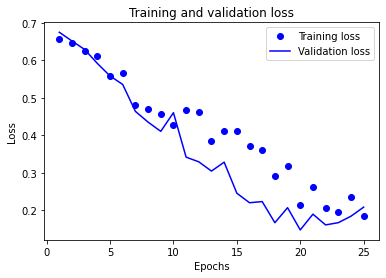

In [ ]:
import matplotlib.pyplot as plt
history_dict = history.history
loss_values = history_dict["loss"]
val_loss_values = history_dict["val_loss"]
epochs = range(1, len(loss_values) + 1)

plt.clf()
plt.plot(epochs, loss_values, "bo", label="Training loss")
plt.plot(epochs, val_loss_values, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

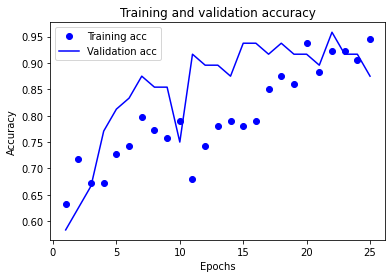

In [ ]:
plt.clf()
acc = history_dict["accuracy"]
val_acc = history_dict["val_accuracy"]
plt.plot(epochs, acc, "bo", label="Training acc")
plt.plot(epochs, val_acc, "b", label="Validation acc")
plt.title("Training and validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

### 2.8 Visualize

In [ ]:
y_cnn_pred_class = model.predict(test_dataset)

In [ ]:
y_cnn_pred = le.inverse_transform(np.argmax(y_cnn_pred_class, axis=-1))

In [ ]:
le = LabelEncoder()
y_cnn_pred = le.fit_transform(y_cnn_pred)
y_cnn_pred[:100]

array([0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0])

In [ ]:
my_y_pred = y_cnn_pred

In [ ]:
pd_y_pred=pd.Series(my_y_pred, name="predictions")
pd_y_pred

0      0
1      0
2      0
3      0
4      0
      ..
995    0
996    0
997    0
998    0
999    1
Name: predictions, Length: 1000, dtype: int64

In [ ]:
dict={0:'without road', 1:'with road'}
pd_y_pred.replace(dict,inplace=True)

In [ ]:
pd_y_pred

0      without road
1      without road
2      without road
3      without road
4      without road
           ...     
995    without road
996    without road
997    without road
998    without road
999       with road
Name: predictions, Length: 1000, dtype: object

In [ ]:
wo_road_idx=[i for i in range(len(pd_y_pred)) if pd_y_pred[i]=='without road']
len(wo_road_idx)

775

In [ ]:
w_road_idx=[i for i in range(len(pd_y_pred)) if pd_y_pred[i]=='with road']
len(w_road_idx)

225

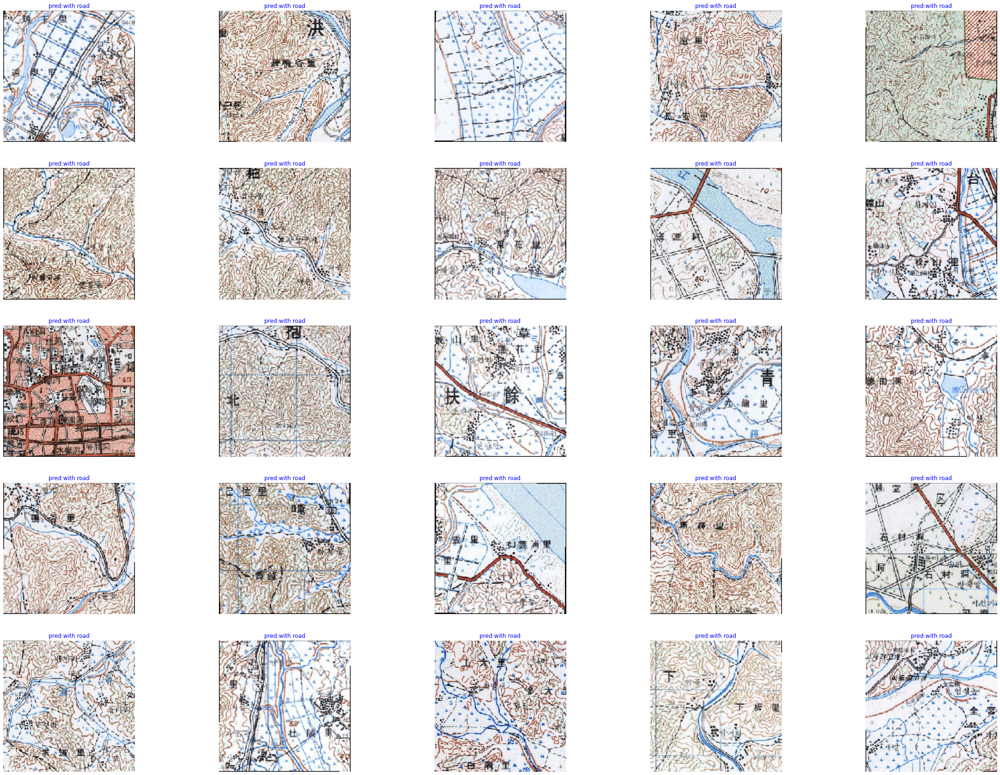

In [ ]:
# Visualize images predicted to be with roads
from keras.preprocessing import image

plt.figure(figsize=(40,30))

num_subplots=25

# randomnize order
import random
random.shuffle(w_road_idx)

for i in range(num_subplots):
  j=w_road_idx[i]
  plt.subplot(5,5,i+1)
  plt.imshow(image.array_to_img(test_input_imgs[j]),cmap='binary', interpolation='bilinear')
  plt.axis('off')
  plt.title('pred:{}'.format(pd_y_pred[j]), fontsize=12, color='blue')

plt.show()


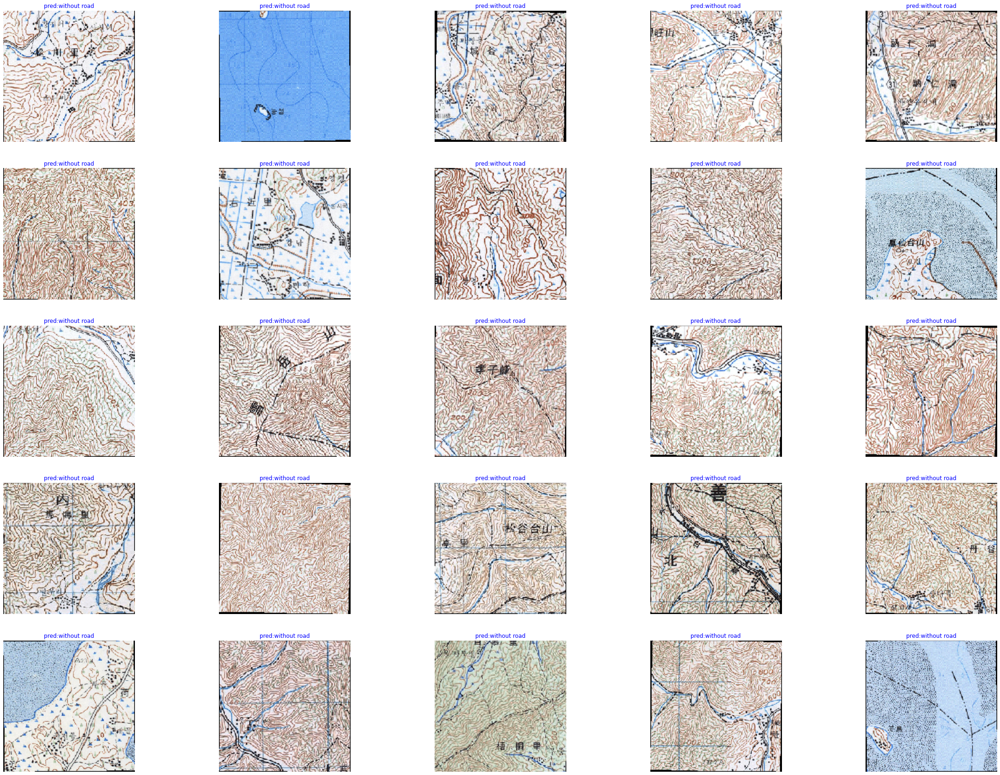

In [ ]:
# Visualize images predicted to be without roads
from keras.preprocessing import image

plt.figure(figsize=(40,30))

num_subplots=25

# randomnize order
import random
random.shuffle(wo_road_idx)

for i in range(num_subplots):
  j=wo_road_idx[i]
  plt.subplot(5,5,i+1)
  plt.imshow(image.array_to_img(test_input_imgs[j]),cmap='binary', interpolation='bilinear')
  plt.axis('off')
  plt.title('pred:{}'.format(pd_y_pred[j]), fontsize=12, color='blue')

plt.show()


### 2.9. Save Model



In [ ]:
# save model
model.save('best_model.h5')

In [ ]:
# download saved model
from google.colab import files
files.download('best_model.h5') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>